## 합성곱 신경망 CNN

### 7.1 전체 구조

지금까지 본 신경망은 인접하는 계층의 모든 뉴런과 결합되어 있다. 이를 완전연결 (fully-connected)이라고 하며, 완전히 연결된 계층을 Affine 계층이라는 이름으로 구현했다. 이 Affine 계층을 사용하면, 가령 층이 5개인 완전연결 신경망은 아래와 같이 구현할 수 있습니다.

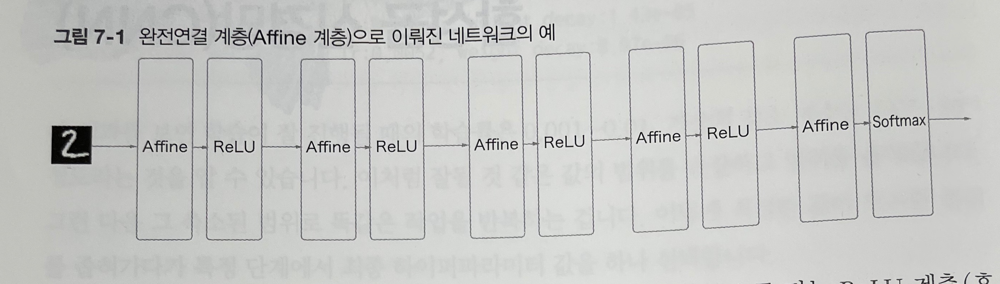

In [2]:
from IPython.display import Image
Image("C:/Users/hoo45/Desktop/1.jpg")

[그림-7-1]과 같이 완전연결 신경망은 Affine 계층 뒤에 활성화 함수를 같은 ReLU계츨 (or Sigmoid 계층)이 이어진다. 

**CNN의 구조**

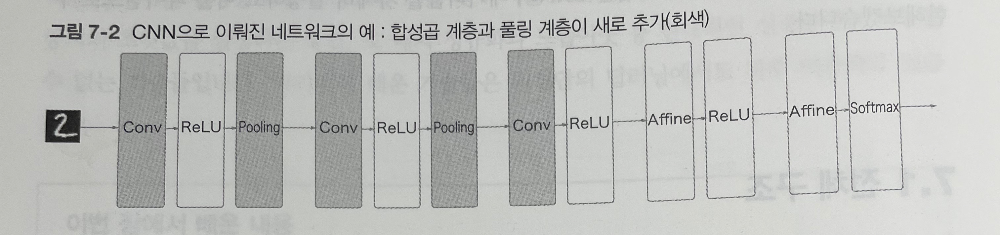

In [3]:
Image("C:/Users/hoo45/Desktop/2.jpg")

CNN에서는 새로운 '합성곱 계층 CONV'와 '풀링 계층polling'이 추가된다. CNN의 계층은 'Conv-ReLU-Pooling'흐름으로 연결된다. Aiffine-ReLU --> Conv-ReLU-Pooling'으로 바뀌었다고 생각할 수 있다.

### 7.2 합성곱 계층

- CNN에서는 패딩Padding, 스트라이드stride등 CNN 고유의 용어가 등장
- 각 계층 사이에는 3차원 데이터같이 입체적인 데이터가 흐른다는 점에서 완전연결 신경망과 다르다.

#### 7.2.1 완전연결 계층의 문제점

- 데이터 형상이 무시된다.
    - 완전연결 계층에 입력할 때 3차원 데이터를 평평한 1차원 데이터로 평탄화해줘야 한다.
    - MNIST 데이터셋을 사용한 사례에서는 형상이 (1,28,28)인 이미지를 1줄로 세운 784개의 데이터를 첫 Affine계층에 입력했다.

- 이미지 3차원 형상이며, 이 형상에는 소중한 공간적 정보가 담겨있다.
    - 3차원 속에 의미를 갖는 본질적인 패턴이 숨어 있을 것이다.
    - 완전연결 계층은 형상을 무시하고 모든 입력 데이터를 동등한 뉴런으로 취급하여 형상에 담긴 정보를 살릴 수 없다.

- 합성곱 계층은 형상을 유지한다.
    - 이미지도 3차원 데이터로 입력받으며, 마찬가지로 다음 계층에도 3차원 데이터로 전달한다.
    - CNN에서는 이미지처럼 형상을 가진 데이터를 제대로 이해할 것이다.

- CNN에서는 합성곱 계층의 입출력 데이터를 **특징 맵**이라고도 합니다. 합성곱 계층의 입력 데이터를 **입력 특징 맵**, 출력 데이터를 **출력 특징 맵**이라고 하는 식이다. 여기서는 '입출력 데이터'와 '특징 맵'을 같은 의미로 사용

#### 7.2.2 합성곱 연산

합성곱 계층에서의 합성곱 연산을 처리합니다. 
- 합성곱 연산 = 필터 연산
- 필터 = 커널 이라고도 한다.

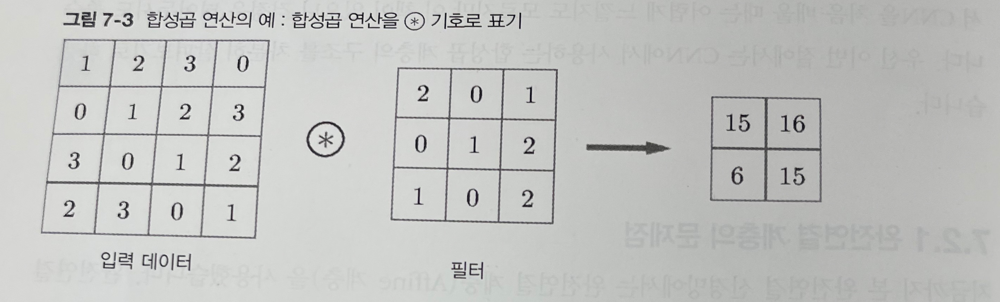

In [2]:
from IPython.display import Image
Image("C:/Users/hoo45/Desktop/7-3.jpg")

합성곱 연산은 필터의 윈도우를 일정 간격으로 이동해가며 입력 데이터에 적용한다. 그림처럼 입력과 필터에서 대응하는 원소끼리 곱한 후 그 총합을 구한다. 그리고 그 결과를 출력의 해당 장소에 저장한다. 이 과정을 모든 장소에서 수행하면 합성곱 연산의 출력이 완성된다.

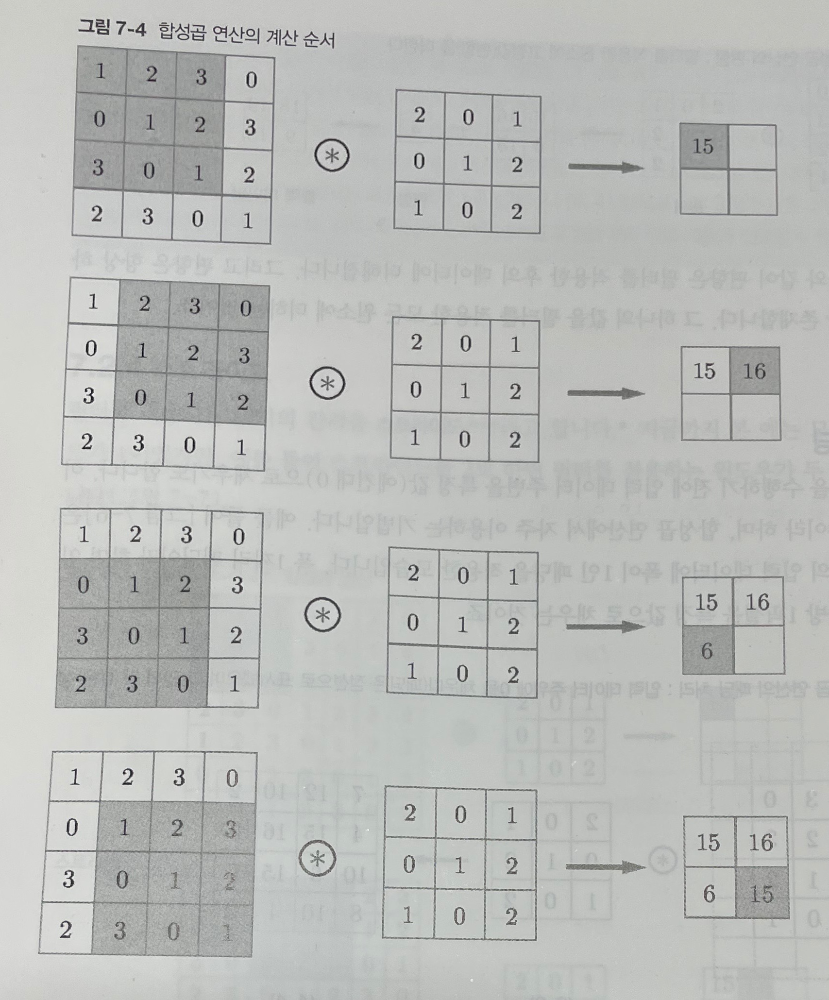

In [3]:
Image("C:/Users/hoo45/Desktop/7-4.jpg")

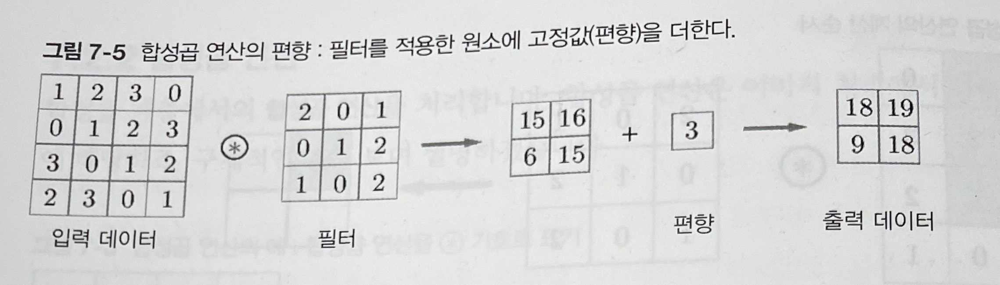

In [5]:
Image("C:/Users/hoo45/Desktop/7-5.jpg")

[그림 7-5] 와 같이 편향은 필터를 적용한 후의 데이터에 더해진다. 편향은 항상 1x1 하나만 존재

#### 7.2.3 패딩

합성곱 연산을 수행하기 전에 입력 데이터 주변을 특정 값으로 채우기도 한다. 이를 패딩이라고 한다.

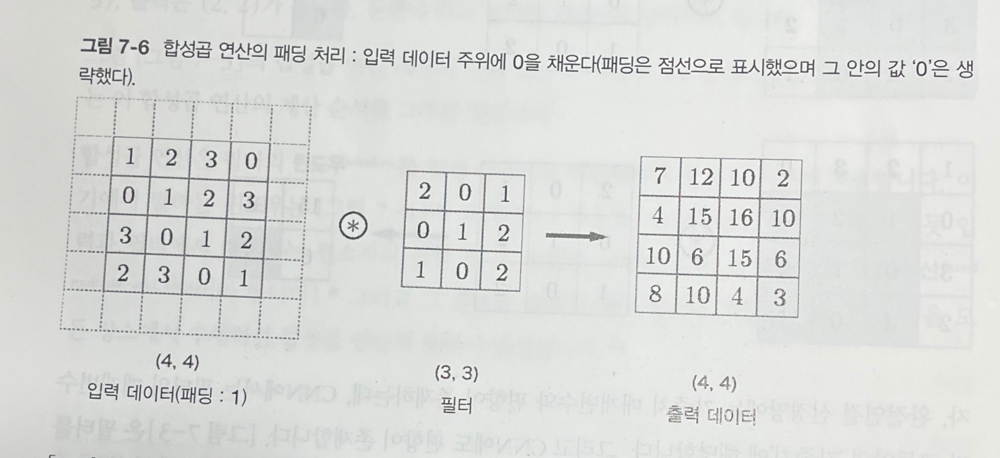

In [6]:
Image("C:/Users/hoo45/Desktop/7-6.jpg")

#### 7.2.4 스트라이드

지금까지 본 스트라이드를 1이라 한다면 스트라이드를 2라고 했을 때 윈도우는 2칸씩 이동한다.

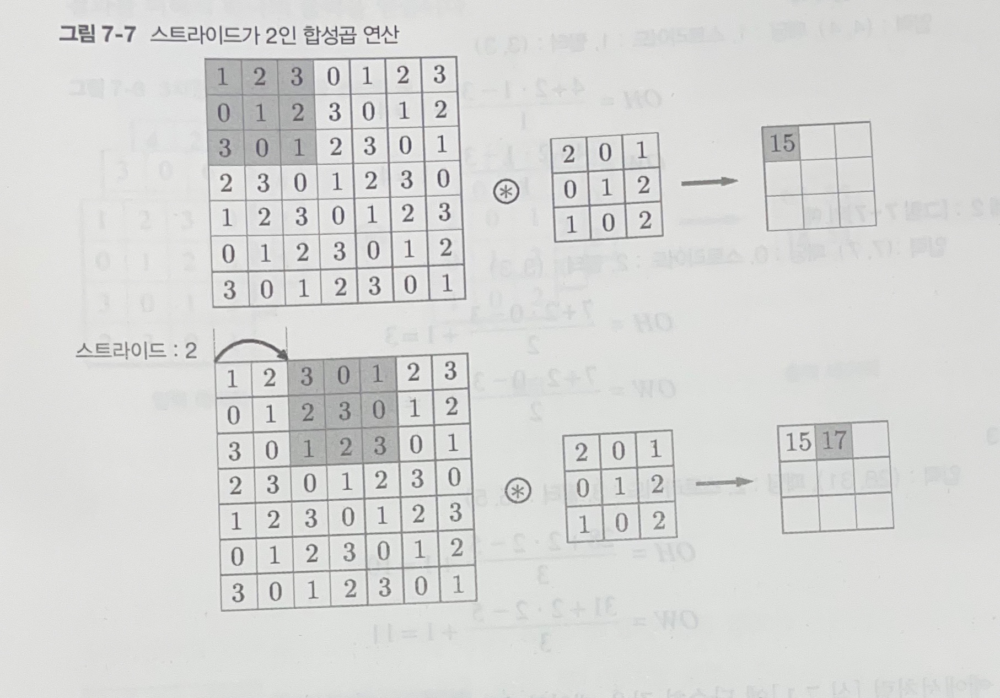

In [7]:
Image("C:/Users/hoo45/Desktop/7-7.jpg")

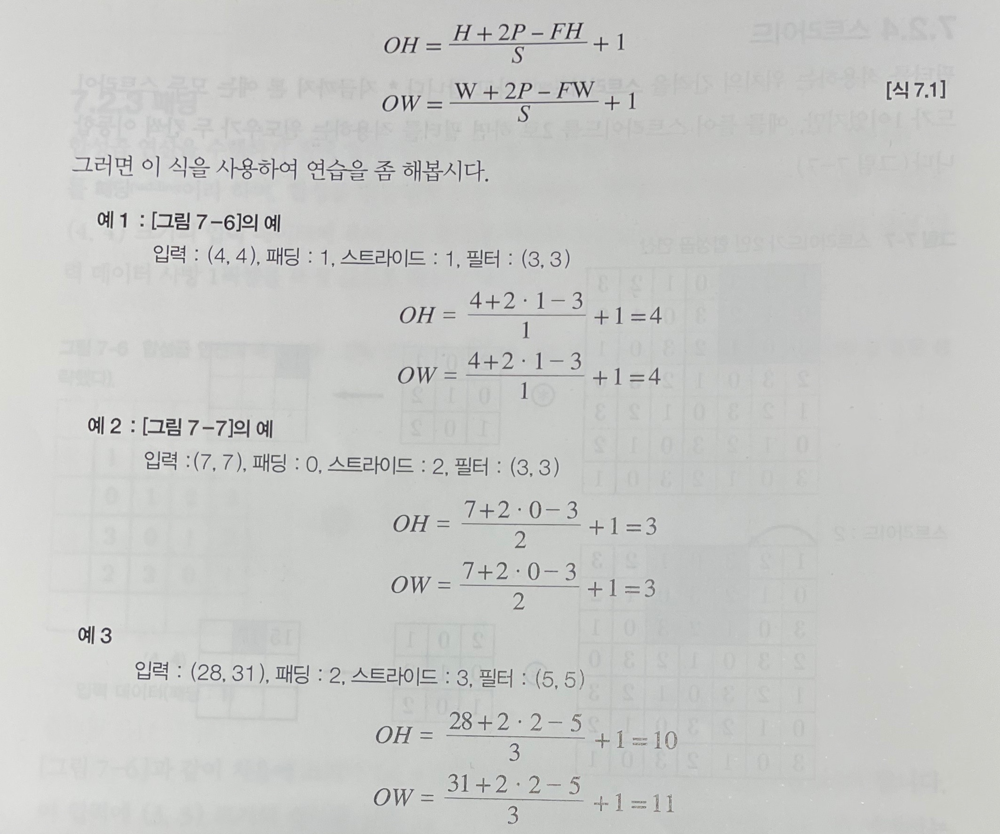

In [18]:
Image("C:/Users/hoo45/Desktop/식7-1.jpg")

#### 7.2.5 3차원 데이터의 합성곱 연산

이미지는 세로 가로 채널까지 3차원 데이터이다. 

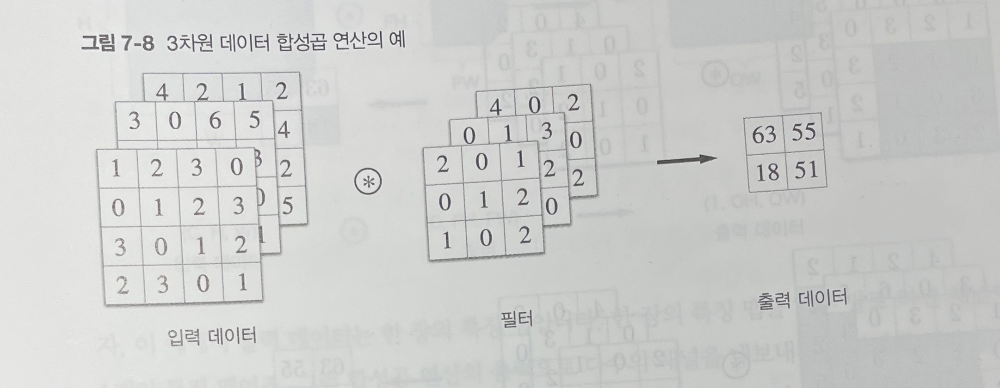

In [8]:
Image("C:/Users/hoo45/Desktop/7-8.jpg")

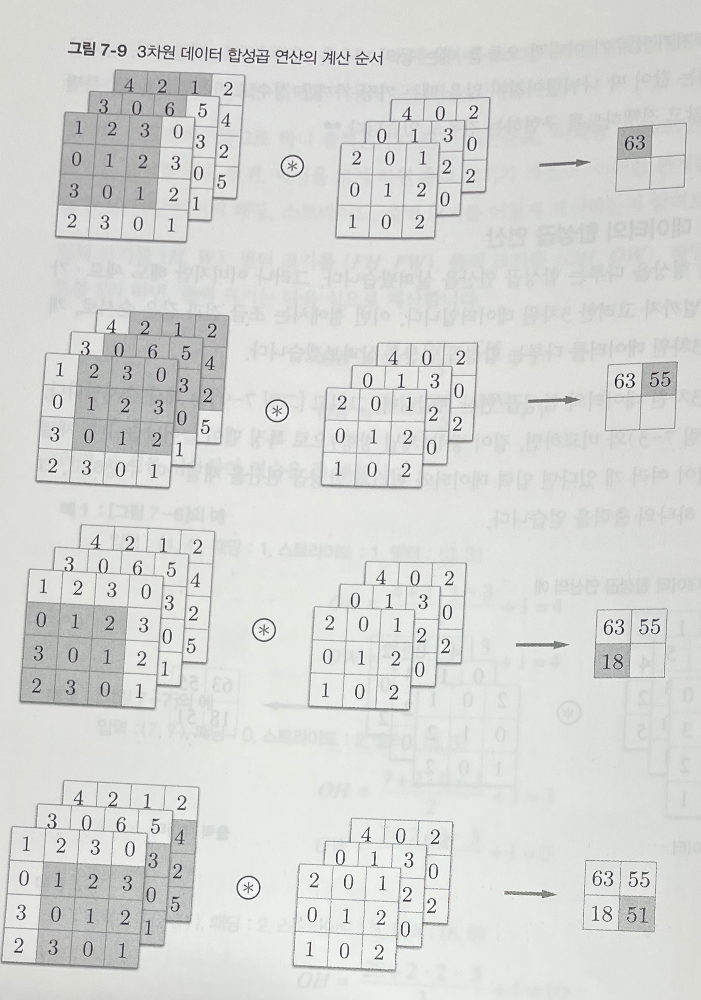

In [9]:
Image("C:/Users/hoo45/Desktop/7-9.jpg")

#### 7.2.6 블록 생각하기

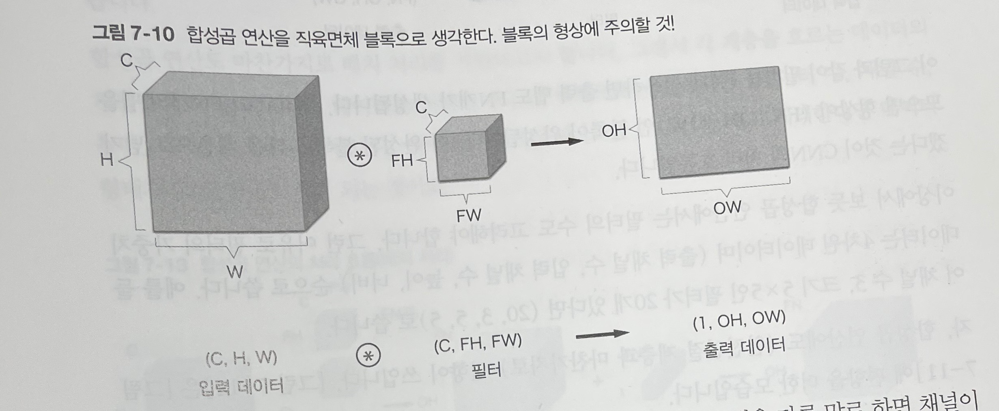

In [10]:
Image("C:/Users/hoo45/Desktop/7-10.jpg")

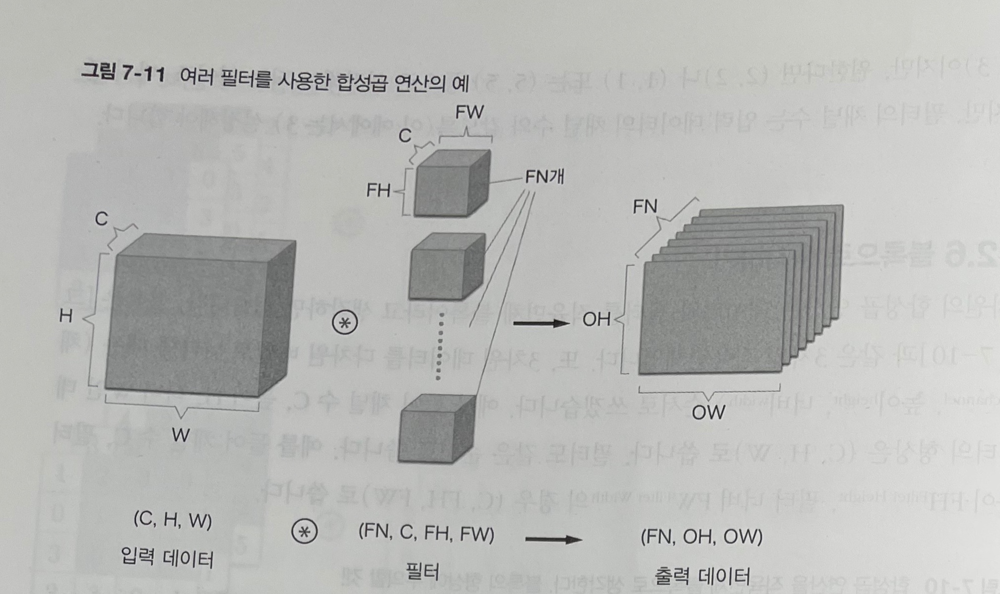

In [11]:
Image("C:/Users/hoo45/Desktop/7-11.jpg")

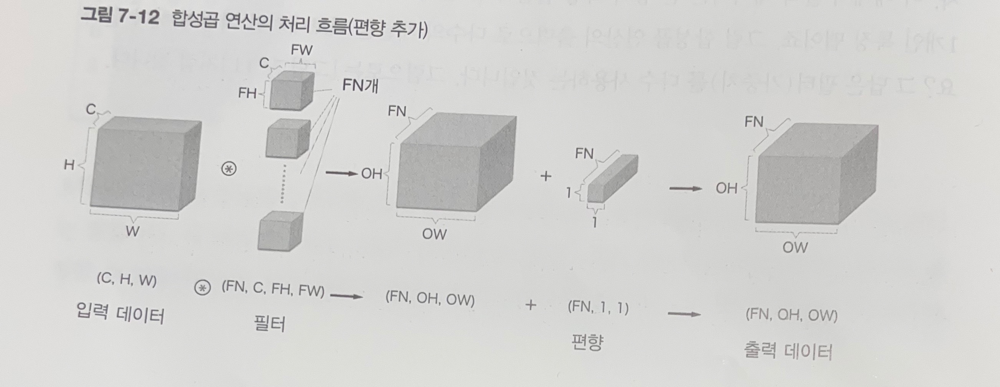

In [12]:
Image("C:/Users/hoo45/Desktop/7-12.jpg")

#### 7.2.7 배치처리

합성곱 연산도 배치처리를 지원하고자 한다. 각 계층을 흐르는 데이터의 차원을 하나 늘려 4차원 데이터로 저장한다. 구체적으로는 데이터를 (데이터 수, 채널 수, 높이, 너비) 순으로 저장한다. 데이터가 N개일 때 위 그림 처럼 배치 처리를 한다면 데이터 형태가 아래 그림처럼 된다.

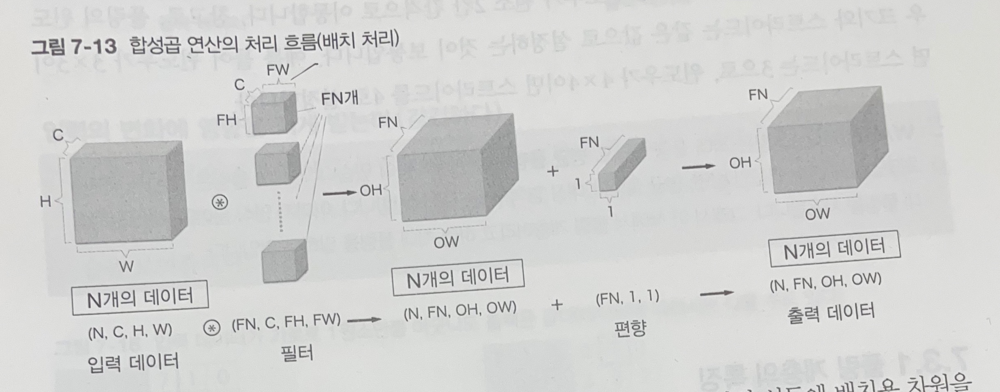

In [13]:
Image("C:/Users/hoo45/Desktop/7-13.jpg")

### 7.3 풀링계층

풀링은 세로 가로 방향의 공간을 줄이는 연산.

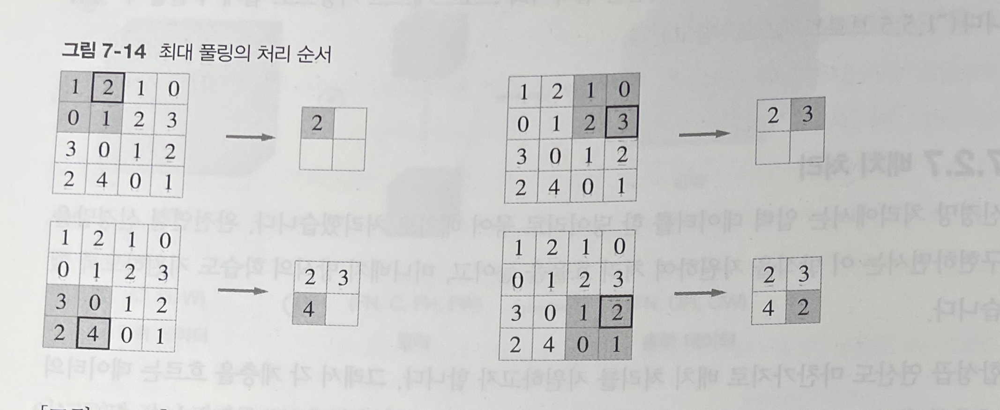

In [14]:
Image("C:/Users/hoo45/Desktop/7-14.jpg")

참고로 풀링의 윈도우 크기와 스트라이드는 같은 값으로 설정하는 것이 보통이다. 예를 들어 윈도우가 3x3이면 스트라이드는 3으로, 윈도우가 4x4이면 스트라이드를 4로 설정한다.

#### 7.3.1 풀링 계층의 특징

#### 학습해야 할 매개변수가 없다.
풀링 계층은 합성곱 계층과 달리 학습해야 할 매개변수가 없다.

#### 채널 수가 변하지 않는다.
풀링 연산은 입력 데이터의 채널 수 그대로 출력 데이터로 내보낸다. 아래 처럼 계산하기 때문,

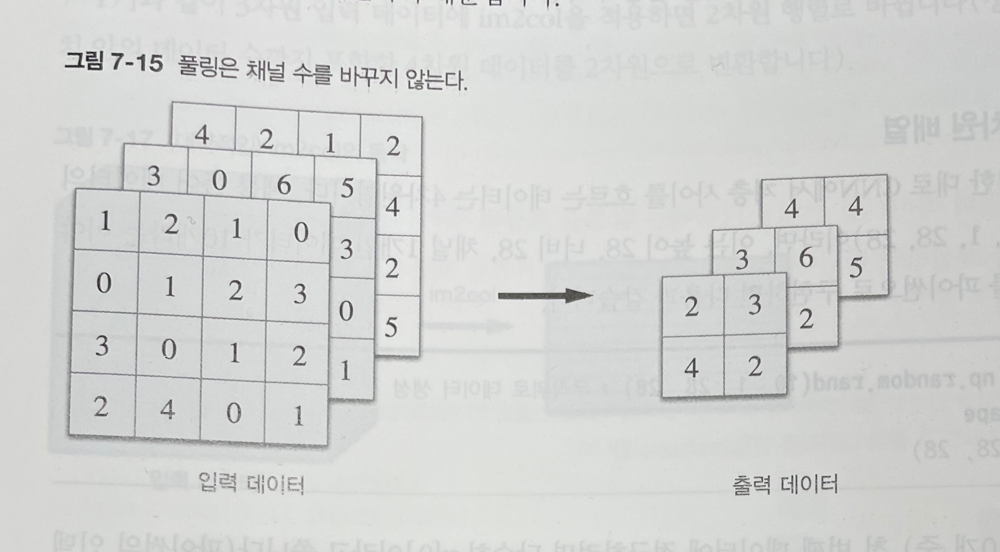

In [17]:
Image("C:/Users/hoo45/Desktop/7-15.jpg")

#### 입력의 변화에 영향을 적게 받는다.
입력 데이터가 조금 변해도 풀링의 결과는 잘 변하지 않는다. 예를들어 아래 그림은 입력 데이터의 차이를 풀링이 흡수해 사라지게 하는 모습을 보여준다.

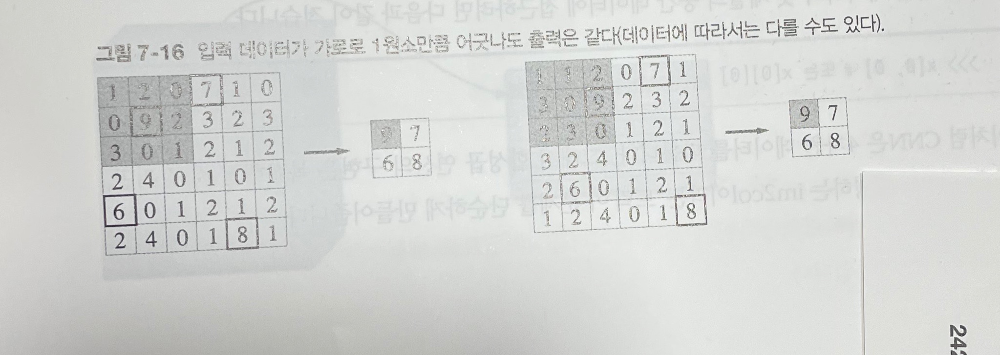

In [16]:
Image("C:/Users/hoo45/Desktop/7-16.jpg")